In [73]:
pip uninstall opencv-python

^C
Note: you may need to restart the kernel to use updated packages.


In [74]:
pip install --upgrade opencv-python


[notice] A new release of pip available: 22.3.1 -> 23.0
[notice] To update, run: python.exe -m pip install --upgrade pip



     ---------------------------------------- 38.2/38.2 MB 1.6 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.6.0.66
    Uninstalling opencv-python-4.6.0.66:
      Successfully uninstalled opencv-python-4.6.0.66


### Contour Detection 1

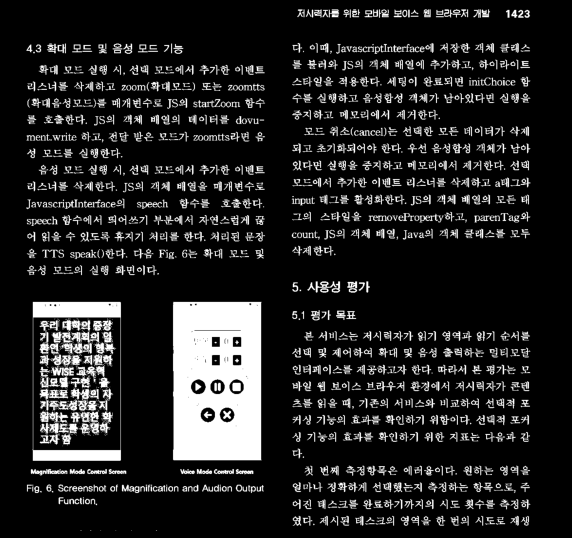

In [135]:
import cv2
import matplotlib.pyplot as plt

# read the image
image = cv2.imread('temp_dataset/temp.png')
# convert to RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
# create a binary thresholded image
_, binary = cv2.threshold(gray, 220, 220, cv2.THRESH_BINARY_INV)
# show it
plt.figure(figsize=[10, 10])
plt.imshow(binary, cmap="gray")
plt.axis('off')
plt.show()

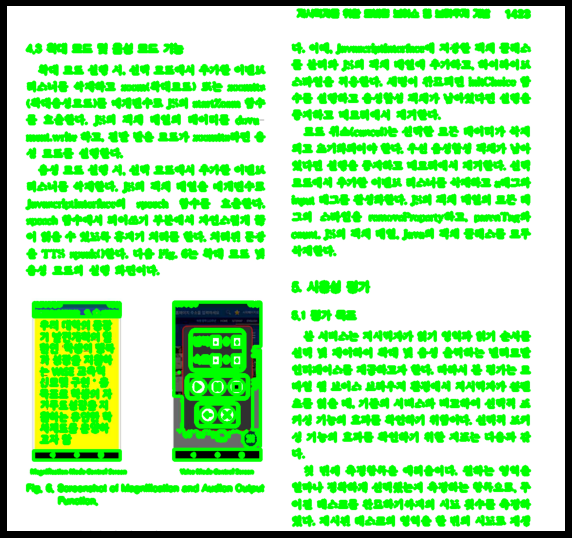

In [134]:
# find the contours from the thresholded image
contours, hierarchy = cv2.findContours(
    binary, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
# draw all contours
image = cv2.drawContours(image, contours, -1, (0, 255, 0), 5)
# show the image with the drawn contours
plt.figure(figsize=[10, 10])
plt.imshow(image)
plt.axis('off')
plt.show()

### Contour Detection 2

In [139]:
cv2.__version__

'4.5.4'

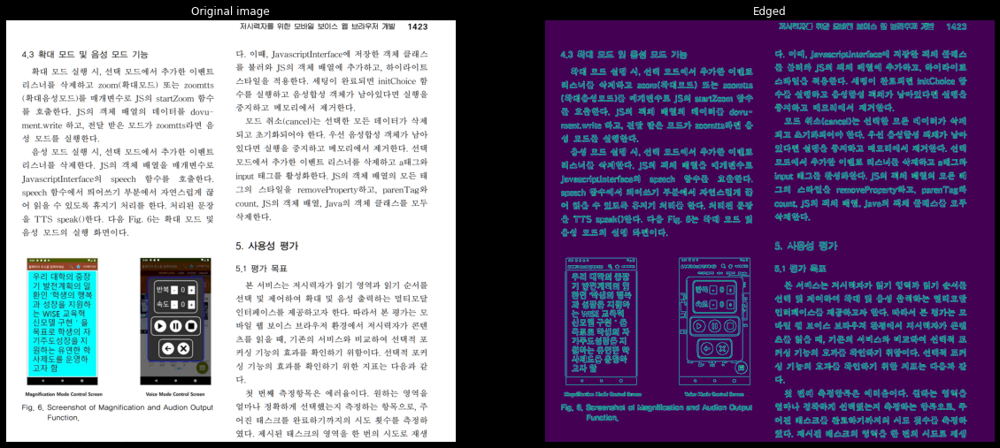

In [157]:
from matplotlib import pyplot as plt
import cv2

image = cv2.imread('temp_dataset/temp.png')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# 노이즈 제거
blurred = cv2.GaussianBlur(gray, (3, 3), 0)

edged = cv2.Canny(blurred, 10, 100)

#Show the image with matplotlib
fig = plt.figure(figsize=(20, 10))
rows = 1
cols = 2

ax1 = fig.add_subplot(rows, cols, 1)
ax1.imshow(image)
ax1.set_title('Original image')
ax1.axis('off')

ax2 = fig.add_subplot(rows, cols, 2)
ax2.imshow(edged)
ax2.set_title('Edged')
ax2.axis('off')

plt.show()

# https://dontrepeatyourself.org/post/edge-and-contour-detection-with-opencv-and-python/

2041 objects were found in this image.


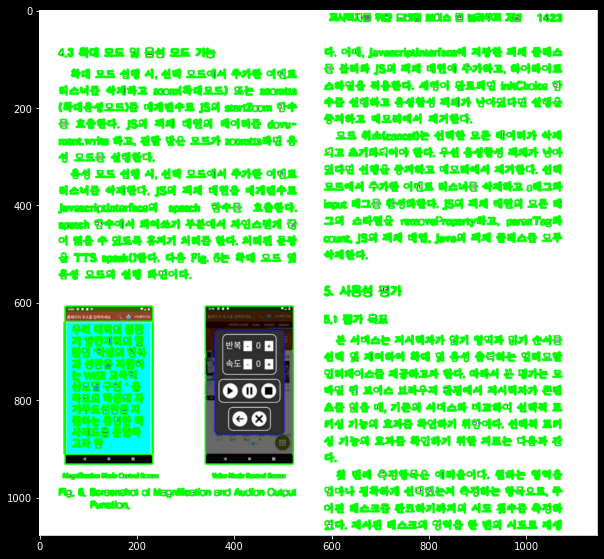

In [155]:
# find the contours in the edged image
contours, _ = cv2.findContours(
    edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
image_copy = image.copy()
# draw the contours on a copy of the original image
cv2.drawContours(image_copy, contours, -1, (0, 255, 0), 2)
print(len(contours), "objects were found in this image.")

plt.figure(figsize=[10, 10])
plt.imshow(image_copy)
plt.show()


### 직접 강의안에 적용시켜 보기

> OS 강의안

In [187]:
import cv2
from matplotlib import pyplot as plt

def convert(path, fileOut):
    image = cv2.imread(path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # 노이즈 제거
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)

    edged = cv2.Canny(blurred, 10, 100)

    # find the contours in the edged image
    contours, _ = cv2.findContours(
        edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    image_copy = image.copy()
    # draw the contours on a copy of the original image
    cv2.drawContours(image_copy, contours, -1, (255, 0, 0), 5)
    print(len(contours), "objects were found in this image.")
    
    #Show the image with matplotlib
    plt.figure(figsize=[10, 10])
    plt.imshow(image_copy)
    plt.axis('off')

    # plt.show()
    plt.savefig(fileOut)
    
    


90 objects were found in this image.
440 objects were found in this image.
284 objects were found in this image.
521 objects were found in this image.
198 objects were found in this image.
448 objects were found in this image.
553 objects were found in this image.
93 objects were found in this image.
627 objects were found in this image.
1359 objects were found in this image.
123 objects were found in this image.
338 objects were found in this image.
447 objects were found in this image.
134 objects were found in this image.
591 objects were found in this image.
530 objects were found in this image.
102 objects were found in this image.
98 objects were found in this image.
73 objects were found in this image.
88 objects were found in this image.
87 objects were found in this image.


C:\Users\sksoh\AppData\Local\Temp\ipykernel_32132\1881352945.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=[10, 10])


667 objects were found in this image.
85 objects were found in this image.
600 objects were found in this image.
730 objects were found in this image.
602 objects were found in this image.
245 objects were found in this image.
60 objects were found in this image.
71 objects were found in this image.
78 objects were found in this image.
48 objects were found in this image.
452 objects were found in this image.
116 objects were found in this image.
120 objects were found in this image.
739 objects were found in this image.
139 objects were found in this image.
107 objects were found in this image.
477 objects were found in this image.
601 objects were found in this image.
219 objects were found in this image.
422 objects were found in this image.
82 objects were found in this image.
82 objects were found in this image.
324 objects were found in this image.
300 objects were found in this image.
425 objects were found in this image.


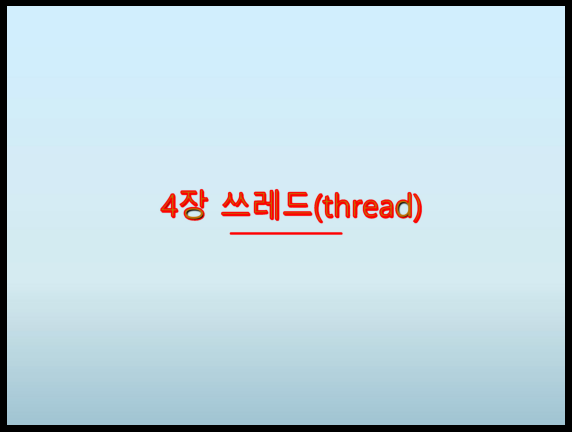

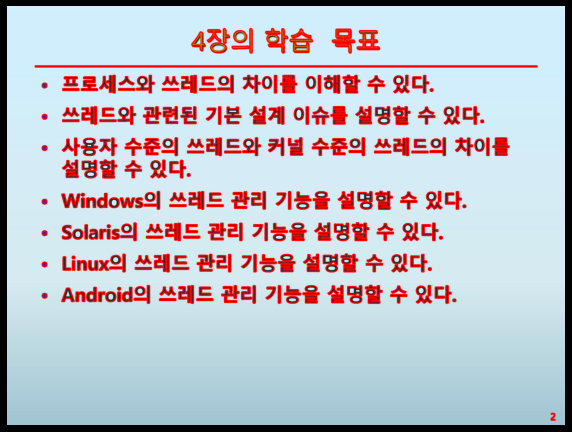

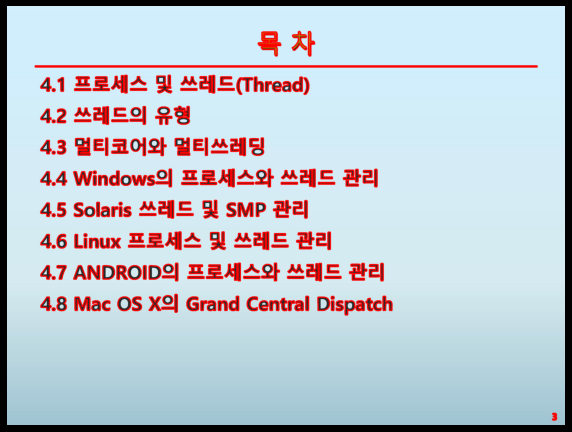

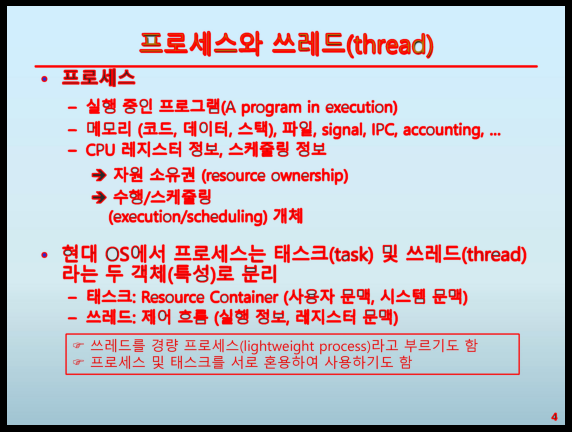

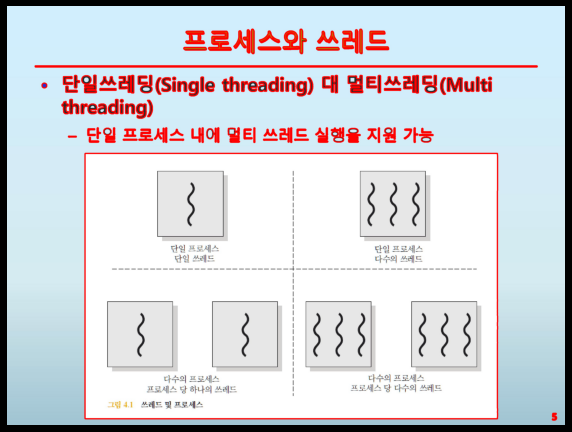

...

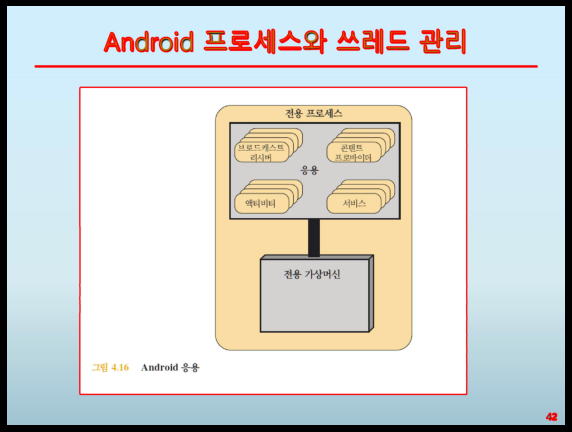

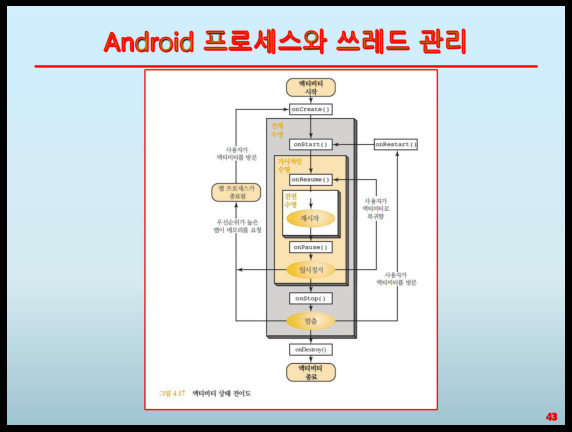

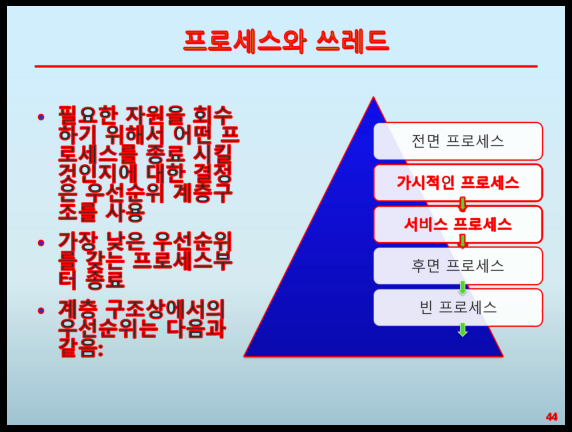

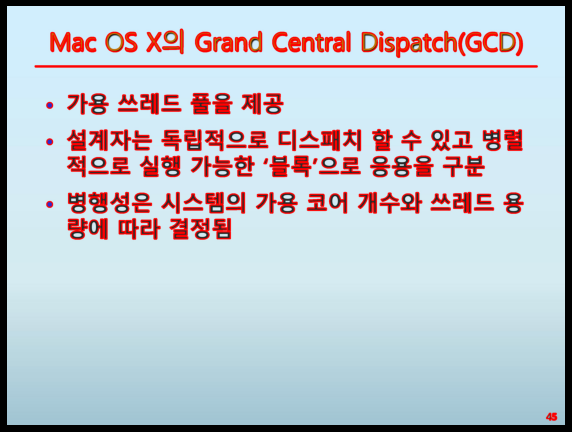

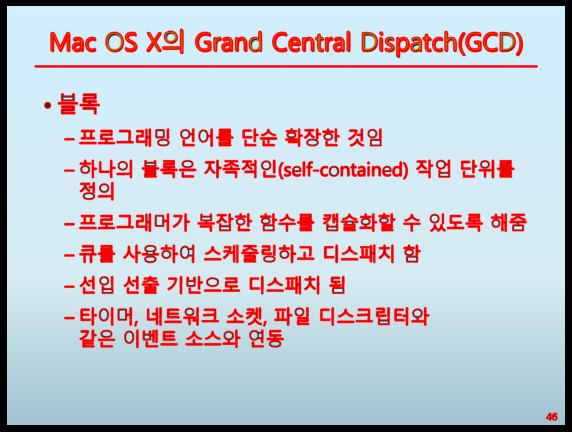

In [188]:
for i in range(1, 47):
    path = ''
    if i < 10:
        path = 'temp_dataset/OS/000' + str(i) + '.jpg'
        fileOut = 'temp_dataset/OS/000' + str(i) + 'conv.jpg'
    else:
        path = 'temp_dataset/OS/00' + str(i) + '.jpg'
        fileOut = 'temp_dataset/OS/00' + str(i) + 'conv.jpg'
       
    convert(path, fileOut)


> 비지니스 강의안 -> 텍스트가 많으므로 Vision API 사용

In [166]:
import argparse  # 입력 파일 이름을 인수로 받을 수 있다.
from enum import Enum  # FeatureType 열거에 사용
import io

from google.cloud import vision
from PIL import Image, ImageDraw
import os


In [184]:
class FeatureType(Enum):
    PAGE = 1
    BLOCK = 2
    PARA = 3
    WORD = 4
    SYMBOL = 5

# text 부분을 bounding box 그리기
# bounds -> get_document_bounds를 통해서 좌표값 get
def draw_boxes(image, bounds, color):
    """Draw a border around the image using the hints in the vector list."""
    draw = ImageDraw.Draw(image)

    for bound in bounds:
        draw.polygon(
            [
                bound.vertices[0].x,
                bound.vertices[0].y,
                bound.vertices[1].x,
                bound.vertices[1].y,
                bound.vertices[2].x,
                bound.vertices[2].y,
                bound.vertices[3].x,
                bound.vertices[3].y,
            ],
            None,
            color,
            width=5,
        )
    return image

def get_document_bounds(image_file, feature):
    # 인증 key 입력
    BASE_DIR = 'private'
    os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = os.path.join(
        BASE_DIR, "C:\\STUDY\\2023-High-Light-SolutionChallenge\\vision_api_key.json")
    client = vision.ImageAnnotatorClient()
    
    bounds = []
    
    with io.open(image_file, 'rb') as image_file:
        content = image_file.read()
        
    image = vision.Image(content=content)
    
    response = client.document_text_detection(image=image)
    document = response.full_text_annotation
    print(document)
    
    # Collect specified feature bounds by enumerating all document features
    for page in document.pages:
        for block in page.blocks:
            for paragraph in block.paragraphs:
                if feature == FeatureType.PARA:
                    bounds.append(paragraph.bounding_box)
    return bounds

def render_doc_text(filein, fileout):
    image = Image.open(filein)
    # bounds = get_document_bounds(filein, FeatureType.BLOCK)
    # draw_boxes(image, bounds, "blue")
    
    bounds = get_document_bounds(filein, FeatureType.PARA)
    draw_boxes(image, bounds, "red")
    
    # bounds = get_document_bounds(filein, FeatureType.WORD)
    # draw_boxes(image, bounds, "yellow")
    
    if fileout != 0:
        image.save(fileout)
    else:
        image.show()

In [185]:
render_doc_text('temp_dataset/temp.png', 'temp_dataset/outTemp.png')
for i in range(1, 9):
    originPath = 'temp_dataset/Business/000' + str(i) + '.jpg'
    convertPath = 'temp_dataset/Business/000' + str(i) + 'conv.jpg'
    render_doc_text(originPath, convertPath)


pages {
  property {
    detected_languages {
      language_code: "ko"
      confidence: 0.889205694
    }
    detected_languages {
      language_code: "en"
      confidence: 0.100371286
    }
  }
  width: 1146
  height: 1077
  blocks {
    bounding_box {
      vertices {
        x: 39
        y: 77
      }
      vertices {
        x: 529
        y: 77
      }
      vertices {
        x: 529
        y: 312
      }
      vertices {
        x: 39
        y: 312
      }
    }
    paragraphs {
      bounding_box {
        vertices {
          x: 40
          y: 77
        }
        vertices {
          x: 361
          y: 77
        }
        vertices {
          x: 361
          y: 97
        }
        vertices {
          x: 40
          y: 97
        }
      }
      words {
        property {
          detected_languages {
            language_code: "ko"
            confidence: 1
          }
        }
        bounding_box {
          vertices {
            x: 40
            y: 77
    

## 이미지만 잘라낼 수 있는 다른 방법 찾기(무조건 있다!)

#### 이미지만 잘라내기

### 이미지만 Contour Detection 할 수 있을까?